# Introduction to Visualizations with matplotlib and folium

As part of my handover, I present this python notebook in the context of visualization techniques, that I learned during my time here at the SGFG and that I judge to be best practice.

>**NOTE:** For a quick introduction to the Jupyter IDE, see [here](https://realpython.com/jupyter-notebook-introduction/)

## 1 Overview

Data Science projects can take many different forms, depending on the objective, your programing skills and the data you are dealing with, among other things. In any case, during your analysis and at the latest, when you present your results to others, you will have to showcase your findings - and it better be in a visually pleasing way!  

To this end, I decided to write a small script (this one) to guide you through a typical data project and showcase the whole process from data aquisition, data exploration, preprocessing and filtering with lots of visualizations. In this project, I will try to use a multitude of different visualization types: the standard ones, easily (and not so easily) obtainable via [matplotlib](https://matplotlib.org/) and interactive maps via [folium](https://python-visualization.github.io/folium/) that might be of special interest to the research group. 

This script is structured as follows. I start by explaining the data that we are dealing with and how to get it. Next, I will introduce the main packages for the first half of the script and dive right into the data exploration part. For this, we will go through some preprocessing/data filtering and deal with 2D line graphs and histograms (from simple ones to multi plots). Next, we will step it up a notch and look at some elaborate plotting methods. Among other things, I will show you how to set up subfigures within figures (not to be confused with plots and subplots!) and how to save plots such that they can be used in later methods. The last section deals with interactive maps. I will introduce the folium package and the concept of geojson files and go through some personal struggle that I had with mapping functions. Finally, we will be able to create interactive maps with popups and explore the map at last :) 

## 2 Getting your hands on some sweet, sweet data

At first, I wasn't sure what kind of data I wanted to use for this project. So, lets ask ourselves:

>*What are some good places to find interesting datasets?*

Of course, the first step for most of us is to google the living hell out of google. And this is the right way to go.
After some time, you will find the websides that offer the data that you need, be it open source or licenced data lurking behind a paywall. For interesting data science projects and datasets, I'd recommend [kaggle](https://www.kaggle.com/datasets) as a starting place. It has a large and active community, many tutorials for python and lots of code, free to use for everybody.

After some mindless search and going down the rabbit hole, I ended up on the official UN webside and downloaded data on the global population, structured by country, age groups and sex (male/female) for the year 2020 as well as predictions until 2100. The dataset can be found [here](https://population.un.org/wpp/Download/Standard/CSV/) (look for `Other variants, every 5 years from 2020 to 2100` and see the description)

## 3 Data Exploration

The first thing in any data project is exploration. You want to get to know the data that you are dealing with and avoid as many surprises as possible later on. With this dataset, I was lucky since the data was consistent and well-kept. This is not the standard and most of time, you have to do some cleaning, be it the removal of some faulty/unlogical rows in your dataset or some renaming (we will come back to this).

In any case, you will need some packages. Base Python is rarely used on its own and there are many pre defined functions that we will take advantage of. Having a general understanding of the following packages is best practice and I would advice you to spend some time with them:

- [pandas](https://pandas.pydata.org/), fast and flexible data analysis and data manipulation tool, you will see this getting used all the time
- [matplotlib](https://matplotlib.org/), a comprehensive library, well-established for most visualization tasks. There are many more plotting tools, yet I think matplotlib is a good start.
- [numpy](https://numpy.org/), used for scienctific computing, resembles matlab in many ways. Here in this script, its playing a minor role, however its powerful once you do more numercial analysis, simulations or vectorization for high performance computations

In the following, I will import some other packages that will come in handy, feel free to check out their documentations on your own.

Lets start importing and lets set up the directories for the input data and the output files.

>**NOTE:** Normally, you would import all the packages that you need throughout your project at the beginning of your script. For educational purposes, I am going to introduce the packages needed for the interactive map, once we get to that section.

In [62]:
import os #working with your operating system
import pandas as pd #create dataframes from your dataset and manipulate them
import numpy as np #for fast computational tasks on array like objects 
import matplotlib.pyplot as plt #standard plotting tool
from matplotlib import gridspec #used for multiplots
import branca #used for the interactive map
from tqdm import tqdm_notebook #a simple load bar

import base64 #import base64, BUT install pybase64; use for embedding of pictures in your html map 

data_dir = './data/' 
result_dir = './results/'

You probably have to install some of the packages on your own. The easiest way to do this, is via pip like this: `pip install [package_name]`. However, sometimes this doesn't work for a multitude of reasons. It is good to know other ways of installing your packages. One alternative, if you are using the Anaconda Distribution (most of you who are using Jupyter Notebook do this as part of this distribution), is to open up an anaconda prompt and type in `conda install [package_name]`. Generally, you should be careful when mixing up different installation procedures.   

Now, lets get started and open up our population data, downloaded and saved under the data directory. Imported via pandas as a dataframe, we name it `df` and look at the first few entries. 

In [4]:
df = pd.read_csv(data_dir + 'WPP2019_PopulationByAgeSex_OtherVariants.csv')
df.head(20)
#check out what data you have/which units/etc.
#check what data you need

,LocID,Location,VarID,Variant,Time,MidPeriod,AgeGrp,AgeGrpStart,AgeGrpSpan,PopMale,PopFemale,PopTotal
0,4,Afghanistan,3,High,2020,2020.5,0-4,0,5,2907.406,2765.103,5672.509
1,4,Afghanistan,3,High,2020,2020.5,5-9,5,5,2774.630,2641.593,5416.223
2,4,Afghanistan,3,High,2020,2020.5,10-14,10,5,2651.664,2540.450,5192.114
3,4,Afghanistan,3,High,2020,2020.5,15-19,15,5,2377.941,2251.504,4629.445
4,4,Afghanistan,3,High,2020,2020.5,20-24,20,5,2017.279,1909.206,3926.485
5,4,Afghanistan,3,High,2020,2020.5,25-29,25,5,1610.796,1498.590,3109.386
6,4,Afghanistan,3,High,2020,2020.5,30-34,30,5,1299.121,1179.138,2478.259
7,4,Afghanistan,3,High,2020,2020.5,35-39,35,5,1068.167,988.220,2056.387
8,4,Afghanistan,3,High,2020,2020.5,40-44,40,5,868.020,790.703,1658.723
9,4,Afghanistan,3,High,2020,2020.5,45-49,45,5,677.226,627.510,1304.736


Some of the data columns are intuitive, like Location, Time, AgeGrp (aka. Age Group), AgeGrpSpan, PopMale, PopFemale and PopTotal (the last three being population numbers in units of 1000). Others are questionable at first sight, like Variant. If your dataset comes with a documentation or explenatory file, look up all attribtutes.

>*It is imperative to know what you are dealing with.*

Lets get a feeling for the different attributes by looking at the available values in the categorical variables.

In [5]:
#looking at the unique countries/regions 
df['Location'].unique()

array(['Afghanistan', 'Africa', 'Albania', 'Algeria', 'Angola',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba', 'Asia',
       'Australia', 'Australia/New Zealand', 'Austria', 'Azerbaijan',
       'Bahamas', 'Bahrain', 'Bangladesh', 'Barbados', 'Belarus',
       'Belgium', 'Belize', 'Benin', 'Bhutan',
       'Bolivia (Plurinational State of)', 'Bosnia and Herzegovina',
       'Botswana', 'Brazil', 'Brunei Darussalam', 'Bulgaria',
       'Burkina Faso', 'Burundi', 'Cabo Verde', 'Cambodia', 'Cameroon',
       'Canada', 'Caribbean', 'Central African Republic',
       'Central America', 'Central Asia', 'Central and Southern Asia',
       'Chad', 'Channel Islands', 'Chile', 'China',
       'China, Hong Kong SAR', 'China, Macao SAR',
       'China, Taiwan Province of China', 'Colombia', 'Comoros', 'Congo',
       'Costa Rica', 'Croatia', 'Cuba', 'Curaçao', 'Cyprus', 'Czechia',
       "Côte d'Ivoire", "Dem. People's Republic of Korea",
       'Democratic Republic of the Congo',

In [6]:
#looking at different variants
df['Variant'].unique()

array(['High', 'Low', 'Constant fertility', 'Instant replacement',
       'Zero migration', 'Constant mortality', 'No change', 'Momentum',
       'Median PI', 'Upper 80 PI', 'Lower 80 PI', 'Upper 95 PI',
       'Lower 95 PI'], dtype=object)

In [7]:
#looking at different times
df['Time'].unique()

array([2020, 2025, 2030, 2035, 2040, 2045, 2050, 2055, 2060, 2065, 2070,
       2075, 2080, 2085, 2090, 2095, 2100], dtype=int64)

In [8]:
#looking at different age groups
df['AgeGrp'].unique()

array(['0-4', '5-9', '10-14', '15-19', '20-24', '25-29', '30-34', '35-39',
       '40-44', '45-49', '50-54', '55-59', '60-64', '65-69', '70-74',
       '75-79', '80-84', '85-89', '90-94', '95-99', '100+'], dtype=object)

We see that the location variable includes also whole regions (i.e. a collection of countries). We see different values for Variant, indicating that it has something to do with the prediction method of populations. As mentioned in section 2, we have access to a documentation page. Here we find more information on the [Variant](https://population.un.org/wpp/DefinitionOfProjectionVariants/) column, confirming our assumption that it sets the scenario for global population development. We see that the predictions are made every 5 years and for age groups with a span in 5 year intervals.  

In the following, lets focus on the high fertility scenario. In addition lets start by exporing the prediction for the whole world. This kind of filtering is taken care of rather nicely in pandas. We specify a condition and apply it to every row to create a new dataframe `df_pred`.

In [9]:
df_pred = df.loc[df['Variant']=='High',:]
df_pred = df_pred.loc[df_pred['Location']=='World',:]
df_pred.head()

,LocID,Location,VarID,Variant,Time,MidPeriod,AgeGrp,AgeGrpStart,AgeGrpSpan,PopMale,PopFemale,PopTotal
1146327,900,World,3,High,2020,2020.5,0-4,0,5,349432.556,328509.234,677941.790
1146328,900,World,3,High,2020,2020.5,5-9,5,5,342927.577,321511.867,664439.444
1146329,900,World,3,High,2020,2020.5,10-14,10,5,331497.486,309769.906,641267.392
1146330,900,World,3,High,2020,2020.5,15-19,15,5,316642.222,295553.758,612195.980
1146331,900,World,3,High,2020,2020.5,20-24,20,5,308286.775,289100.903,597387.678


### 3.1 2D Line Graphs

Nothing beats a simple functional depedency of some variable over time. At least for starters (we will increase the pace by which we go through this dataset in a moment). 

Let us focus on the Time and PopTotal attribute.

In [10]:
df_pred[['Time','PopTotal']]

,Time,PopTotal
1146327,2020,677941.790
1146328,2020,664439.444
1146329,2020,641267.392
1146330,2020,612195.980
1146331,2020,597387.678
...,...,...
1146679,2100,380426.984
1146680,2100,268140.566
1146681,2100,150953.331
1146682,2100,62493.356


For each time value, there are multiple values for the total population. This is due the fact, that the total population is given per age group. Thus, we first have to sum up the population number **for each year**. This can be done with the [groupby](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.groupby.html) method. We group the two columns of our `df_pred` by the Time column and apply a summation afterwards (also multiply by 1000, to make the units come out right).

In [11]:
df_pred[['Time','PopTotal']].groupby(['Time']).sum()*1000

,PopTotal
Time,
2020,7.794799e+09
2025,8.254963e+09
2030,8.733522e+09
2035,9.218767e+09
2040,9.682332e+09
2045,1.013416e+10
2050,1.058777e+10
2055,1.105277e+10
2060,1.152922e+10


Given this, we are able to plot the estimated world population as a function of time. Using matplotlib (to be more exact, we use matplotlib.pyplot), we specify first the figure object itself, giving it some size. We add our grouped and summed data (see previous code cell) as a black curve. Finally, we add a title.  

Text(0.5, 1.0, 'Estimated World Population')

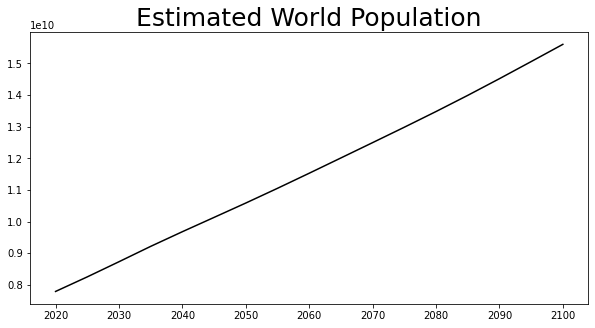

In [12]:
plt.figure(figsize=(10,5))
plt.plot(df_pred[['Time','PopTotal']].groupby(['Time']).sum()*1000,color='black')
plt.title('Estimated World Population',fontsize=25)

So far so good. We are in the high fertility scenario and we see a simple linear growth prediction. Now, how about something more elaborate?

For example, lets look at the population growth for both sexes and call the dataframes `y_m`, `y_f`. Using the above methodology:

In [13]:
y_m = df_pred[['Time','PopMale']].groupby(['Time']).sum()*1000
y_f = df_pred[['Time','PopFemale']].groupby(['Time']).sum()*1000

As another example, we can create dataframes for the population growth per age group (you can try and think about a more elegant way to do this, I just hard-coded it). As you can see, you can use groupby on more than one attribute. In this case, let us create dataframes for age groups that have a span of 20, instead of just 5 years (i.e. sum up the respective entries). This gives us `df_0` for age groups 0 to 19, `df_20` for age groups 20 to 39 and so on.

In [14]:
df_pred_grp = df_pred[['Time','AgeGrp','PopTotal']].groupby(['AgeGrp','Time']).sum()*1000
df_0 = df_pred_grp.loc['0-4',:] + df_pred_grp.loc['5-9',:] + df_pred_grp.loc['10-14',:] + df_pred_grp.loc['15-19',:]
df_20 = df_pred_grp.loc['20-24',:] + df_pred_grp.loc['25-29',:] + df_pred_grp.loc['30-34',:] + df_pred_grp.loc['35-39',:]
df_40 = df_pred_grp.loc['40-44',:] + df_pred_grp.loc['45-49',:] + df_pred_grp.loc['50-54',:] + df_pred_grp.loc['55-59',:]
df_60 = df_pred_grp.loc['60-64',:] + df_pred_grp.loc['65-69',:] + df_pred_grp.loc['70-74',:] + df_pred_grp.loc['75-79',:]
df_80p = df_pred_grp.loc['80-84',:] + df_pred_grp.loc['85-89',:] + df_pred_grp.loc['90-94',:] + df_pred_grp.loc['95-99',:] + df_pred_grp.loc['100+',:]

We can create single plots for all of these, but how about putting multiple graphs into one plot? How about combining multiple plots into one figure? And how about changing the relative size of each of those subplots? 

Let us try to do all at once (I warned you). We want one plot for the estimated world population (as before), one plot for the split into male/female and one plot for the split into the different age groups. The last one will be rather crowded, so we want its plot to have double the width of the ones before. 

First, we want to have multiple plots in one figure. matplotlib allows us to instanciate a blank figure via `plt.figure()` and than add to it in a modular way. Next, use `gridspec.GridSpec(4,1)` to create a 4 by 1 raster (i.e. 4 rows, 1 column). Now, to address a single row or column we use `fig.add_subplot()`. The resulting object is denoted as axis or often ax for short. The first subplot is the same as before. For the second one we use a stackplot. We can add labels and a legend rather easily. Also, to change the colors of each graph see [this](https://matplotlib.org/stable/gallery/color/named_colors.html) list for all the color pallets. For the third, we address 2 rows, such that it has double the width and repeat basically the steps from the second plot.    

At last, we can change the background of the plot via `plt.style.use`. You will find a list of common themes [here](https://matplotlib.org/stable/gallery/style_sheets/style_sheets_reference.html). However, one classic choice is *seaborn-darkgrid* ([seaborn](https://seaborn.pydata.org/) itself is another useful plotting package, btw). It us used in many areas in the industry. I can recommend it, especially for presentations with the higher-ups in your company, it makes every plot look just a little bit more professional.

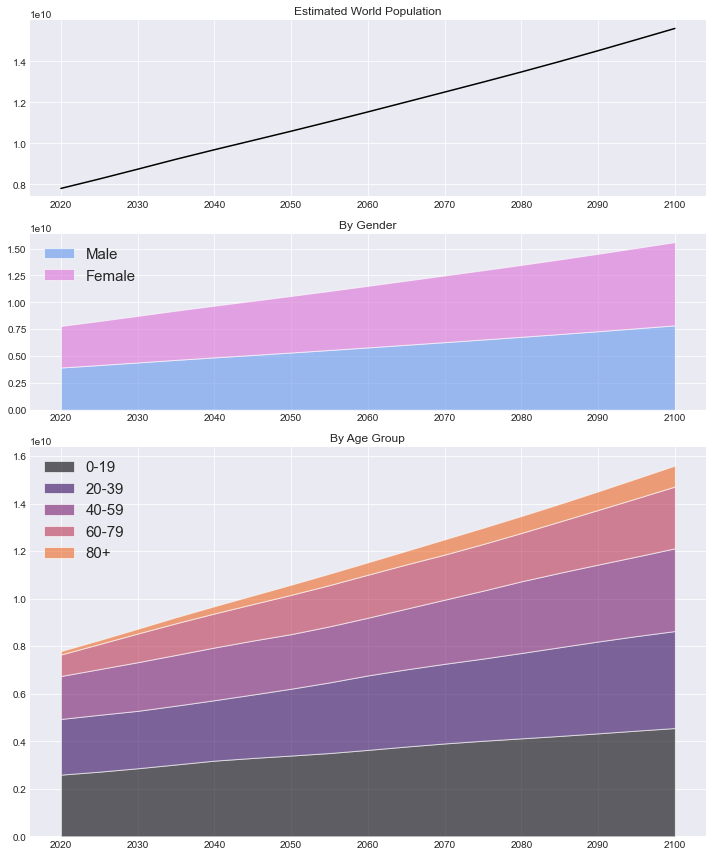

In [15]:
plt.style.use('seaborn-darkgrid')

fig = plt.figure(figsize=(10,12),tight_layout=True) # instaciate the blank figure

spec = gridspec.GridSpec(4,1)

#first plot
ax1 = fig.add_subplot(spec[0, :])
ax1.plot(df_pred[['Time','PopTotal']].groupby(['Time']).sum()*1000,color='black')
ax1.set_title('Estimated World Population')

#second plot
ax2 = fig.add_subplot(spec[1, :])
ax2.stackplot(y_m.index,y_m['PopMale'],y_f['PopFemale'],alpha=0.6,
              colors=['cornflowerblue','orchid'], edgecolor='white',labels=['Male','Female'])
ax2.set_title('By Gender')
ax2.legend(fontsize=15,loc=2) #add a legend

#third plot
ax3 = fig.add_subplot(spec[2:, :]) #take the 3rd and 4th row together 
ax3.stackplot(df_0.index,
              df_0['PopTotal'],
              df_20['PopTotal'],
              df_40['PopTotal'],
              df_60['PopTotal'],
              df_80p['PopTotal'],
              edgecolor='white',alpha=0.6,
              colors = list(plt.cm.get_cmap('inferno', 7).colors),
              labels = ['0-19','20-39','40-59','60-79','80+']
             )
ax3.set_title('By Age Group')
ax3.legend(fontsize=15,loc=2)

We looked at the world population so far. It would be nice to have a function to choose from the different countries and plot its population growth. We can use the code above for the age groups and wrap it inside a function that returns the figure. This is not just for funsies, we will come back to this in a later subsection.  

In [16]:
def population_prediction_by_country(country):
    
    #filter df for the respective country
    df_country = df.loc[(df['Variant']=='High') & (df['Location']==country),:]
    
    #compute the groups as before
    df_country_grp = df_country[['Time','AgeGrp','PopTotal']].groupby(['AgeGrp','Time']).sum()*1000
    df_0 = df_country_grp.loc['0-4',:] + df_country_grp.loc['5-9',:] + df_country_grp.loc['10-14',:] + df_country_grp.loc['15-19',:]
    df_20 = df_country_grp.loc['20-24',:] + df_country_grp.loc['25-29',:] + df_country_grp.loc['30-34',:] + df_country_grp.loc['35-39',:]
    df_40 = df_country_grp.loc['40-44',:] + df_country_grp.loc['45-49',:] + df_country_grp.loc['50-54',:] + df_country_grp.loc['55-59',:]
    df_60 = df_country_grp.loc['60-64',:] + df_country_grp.loc['65-69',:] + df_country_grp.loc['70-74',:] + df_country_grp.loc['75-79',:]
    df_80p = df_country_grp.loc['80-84',:] + df_country_grp.loc['85-89',:] + df_country_grp.loc['90-94',:] + df_country_grp.loc['95-99',:] + df_country_grp.loc['100+',:]
    
    #set up style, figure and plot 
    plt.style.use('seaborn-darkgrid')
    fig = plt.figure(figsize=(8,5),tight_layout=True)
    plt.stackplot(df_0.index,
                  df_0['PopTotal'],
                  df_20['PopTotal'],
                  df_40['PopTotal'],
                  df_60['PopTotal'],
                  df_80p['PopTotal'],
                  edgecolor='white',alpha=0.6,
                  colors = list(plt.cm.get_cmap('inferno', 7).colors),
                  labels = ['0-19','20-39','40-59','60-79','80+']
                 )
    plt.title('Population prediction of Age Groups',fontsize=20) #add title
    #plt.set_title('By Age Group')
    plt.legend(fontsize=15,loc=2) #add legend
    
    plt.close(fig) #close the plot
    
    return(fig)

Lets apply it for some countries. 

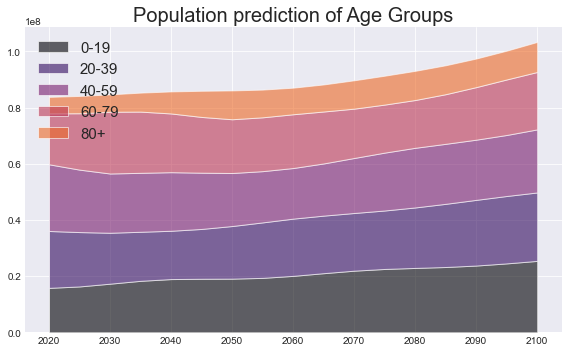

In [19]:
fig = population_prediction_by_country('Germany')
fig

### 3.2 Histograms

How is a specific data attribute distributed? In many scenarios, you won't deal with samples from a well defined distribution, like the uniform, normal or exponential decaying one. Real data can be quite nasty and you should look at its empirical distribution function, or even better: its [**empirical probability density function**](https://en.wikipedia.org/wiki/Probability_density_function) at least once.

Why is that? A density function gives you an idea of its mean, variance, if its heavy tailed etc. and provides you with a birds eye view. In the context of visualization, it can help you decide, which features to represent in what way. Now, in order to convey this kind of information to someone fast, a probability density plot might be too much. Instead, lets look at a highly discretized version, the simple histogram. 

For this, lets go back to our dataframe `df` and create a new subset. Again, we filter for the high fertilily scenario but this time for two years, namely 2020 and the prediction for 2025. We filter for Location, Time, PopTotal, PopMale and PopFemale. Next, lets do another groupby, however for the Location and Time attribute together. This will give the following population numbers, grouped together first by country, then by the respective year. We basically end up with a multiindexed dataframe.      

In [20]:
df_20_25 = df.loc[((df['Time']==2020)|(df['Time']==2025)) & (df['Variant']=='High'),:].reset_index(drop=True)
df_20_25 = df_20_25[['Location','Time','PopTotal','PopMale','PopFemale']]
df_20_25 = df_20_25.groupby(['Location','Time']).sum()
df_20_25.head()

PopTotal     PopMale   PopFemale
Location    Time                                     
Afghanistan 2020    38928.341   19976.265   18952.076
            2025    43909.177   22501.915   21407.262
Africa      2020  1340598.113  669878.340  670719.773
            2025  1521823.033  761000.536  760822.497
Albania     2020     2877.800    1464.714    1413.086

At this point we have a lot of choice, since we can derive a multitude of metrics. Therefore I recommend

>*Build and explore lots of metrics*

As an example, I will look at the predicted population increase in [%] per country from 2020 to 2025 and the gender ratio (male to female). Lets call the new dataframe `df_gain`, take the Location index from the previous dataframe and use it here as our new index. We instanciate two new columns, PopIncrease and SexRatio for the aforementioned metrics. Then we loop through the index, applying standard computations to get the desired result.    

In [21]:
df_gain = pd.DataFrame([],index=df_20_25.index.get_level_values(0).unique()) #use get_level_values(lvl) to a specific index from a multiindex
df_gain['PopIncrease'] = 0
df_gain['SexRatio'] = 0
for idx in df_gain.index:
    df_gain.loc[idx,'SexRatio'] = df_20_25.loc[idx].loc[2020,'PopMale']/df_20_25.loc[idx].loc[2020,'PopFemale']
    df_gain.loc[idx,'PopIncrease'] = (df_20_25.loc[idx].loc[2025,'PopTotal']/df_20_25.loc[idx].loc[2020,'PopTotal'] -1 )*100

Histogram plots are just as easy to implement as line plots, using the respective `plt.hist`. We could stop here, however I formed a habit out of adding a vertical line at the mean value of my distributions. (You could do the same at different quantile levels, essentially forming a boxplot overlay. The possibilies are endless here, just keen the readability of your plots in mind.) The computation of statistics like the mean is a one-liner in pandas. Take your attribute of choice and use the build in `mean()` command. Done.

Lets start with the histogram for the predicted population increase.

Text(0.5, 0, 'gain in [%]')

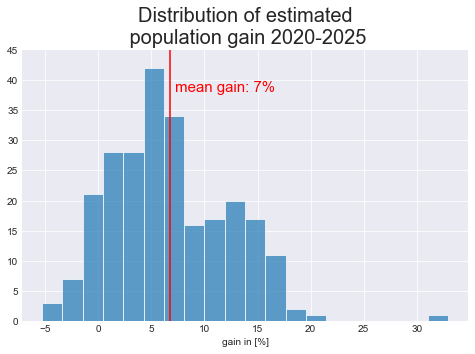

In [22]:
plt.style.use('seaborn-darkgrid')
plt.figure(figsize=(8,5))
plt.hist(df_gain['PopIncrease'].values,alpha=0.7,edgecolor='white',bins=20)
plt.ylim(0,45) #specify boundaries, its optional but helps with plotting the next vertical line at the mean value 

mean_gain = df_gain['PopIncrease'].values.mean() #specify mean
plt.vlines(x=mean_gain,ymin=0,ymax=45,color='red') #plot vertical line
plt.text(mean_gain+0.5,38,'mean gain: {}%'.format(round(mean_gain),2),color='red',fontsize=15) #add text

plt.title('Distribution of estimated\n population gain 2020-2025',fontsize=20)
plt.xlabel('gain in [%]')

We see a bimodal distribution with a mean of around 7%. We observe a few countries with a predicted population decline and some countries with high prediction. Lets check out the later group. 

In [23]:
df_gain.loc[df_gain['PopIncrease']>17,:]

,PopIncrease,SexRatio
Location,,
Angola,18.027082,0.979252
Democratic Republic of the Congo,17.162452,0.996855
Equatorial Guinea,17.648229,1.253411
Niger,21.205152,1.011107
Syrian Arab Republic,32.930021,1.002228


Now then, lets look at the gender rario.

Text(0.5, 0, 'Ratio')

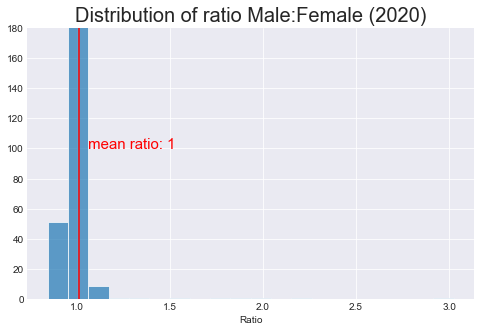

In [24]:
#includes whole continents
plt.style.use('seaborn-darkgrid')
plt.figure(figsize=(8,5))
plt.hist(df_gain['SexRatio'].values,alpha=0.7,edgecolor='white',bins=20)
plt.ylim(0,180)

mean_ratio = df_gain['SexRatio'].values.mean()
plt.vlines(x=mean_ratio,ymin=0,ymax=180,color='red')
plt.text(mean_ratio+0.05,100,'mean ratio: {}'.format(round(mean_ratio),2),color='red',fontsize=15)

plt.title('Distribution of ratio Male:Female (2020)',fontsize=20)
plt.xlabel('Ratio')

The plot shows a clear peak around 1, which reveals that most countries have a balanced gender ratio. However some countries have a higher portion of women (ratio<1) and some a higher portion of men (ratio>1). You might be wondering, why the density is shifted so much to the right. Apparently, a small minority countries have an immense surplus of men. Normally, you would try to adjust your plot by consciously filtering values above or below some quantile (normally around 1-5% and 95-99%) if you are dealing with extreme outliers. 
Again, lets have a look at the countries with a ratio greater than 2. 

In [69]:
df_gain.loc[df_gain['SexRatio']>2,:]

,PopIncrease,SexRatio
Location,,
Qatar,8.995752,3.024248
United Arab Emirates,5.314436,2.238453


So far, we only looked at one dimensional histograms. How about a two dimensional one? It would be interesting to see, if we can find some patterns in our two metrics discussed so far. Of course, one can compute correlation measures, but then again, this is just a single number, compared to a more birds-eye view of the data as a whole.

The following code will do just that. We will do a scatter plot for the joint distribution of gender ratio and population increase and add the respective histograms for the marginal distributions. At this point, I could try and do a similar explanation as in the previous subsection. However, I will use this chance to introduce another important concept: 

>*If someone solved your problem before, find and copy that code*

More often than not, pages like [stackoverflow](https://stackoverflow.com/) are your best companions when looking up error messages or for getting some inspiration on how to code a certain thing. Someone, somewhere already had to deal with a similar problem like you and people provided solutions to that. In our case its even better, since the [matplotlib documentation page](https://matplotlib.org/stable/gallery/axes_grid1/scatter_hist_locatable_axes.html#sphx-glr-gallery-axes-grid1-scatter-hist-locatable-axes-py) provides the entire code four us! There you go.

Text(0.5, 0.98, 'Joint Distribution\n')

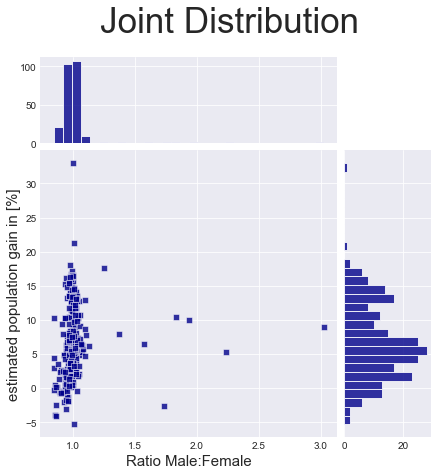

In [26]:
from mpl_toolkits.axes_grid1 import make_axes_locatable #matches the shared axes

#I could add comments to this code, but really, its just copied from the documentation page, so go there 

plt.style.use('seaborn-darkgrid')
fig, ax = plt.subplots(figsize=(7, 7))
ax.scatter(df_gain['SexRatio'], df_gain['PopIncrease'],color='darkblue',
           alpha=0.8,marker='s',edgecolor='white',linewidth=0.6)

plt.xlabel('Ratio Male:Female',fontsize=15)
plt.ylabel('estimated population gain in [%]',fontsize=15)

divider = make_axes_locatable(ax)

ax_histx = divider.append_axes("top", 1.2, pad=0.1, sharex=ax)
ax_histy = divider.append_axes("right", 1.2, pad=0.1, sharey=ax)

ax_histx.xaxis.set_tick_params(labelbottom=False)
ax_histy.yaxis.set_tick_params(labelleft=False)

ax_histx.hist(df_gain['SexRatio'],bins=30,edgecolor='white',alpha=0.8,color='darkblue')
ax_histy.hist(df_gain['PopIncrease'],bins=30,edgecolor='white',alpha=0.8,color='darkblue',
              orientation='horizontal')

plt.suptitle('Joint Distribution\n',fontsize=35)


Altough the plot looks nice, we can't get any real information out of it. Our two metrics don't show any interesting patterns. Well that happens, better luck next time!   

### 3.3 Elaborate plotting: population pyramids

While playing around with histograms, as is so often the case, I thought it would be interesting to try and plot some population pyramids. Given our data, it is the natural thing to do. First, we start again by filtering our dataframe `df` to contain only the entries for the year 2020 and for the high fertility scenario. Then, filter by columns and keep only those with real information (i.e. exclude Variant and ID columns). This gives the dataframe for our demographic analysis `df_demogr`.  

In [27]:
df_demogr = df.loc[(df['Time']==2020) & (df['Variant']=='High'),:].reset_index(drop=True)
df_demogr = df_demogr[['Location','Time','AgeGrp','AgeGrpStart','PopMale','PopFemale','PopTotal']]

Lets have our population pyramids not in absolute but percantage numbers. Therefore, we add new columns to `df_demogr` by summing up the total population for each country over all age groups and further dividing all age groups of both sexes.   

In [28]:
#add new features
df_demogr['PopMale%'] = 0
df_demogr['PopFemale%'] = 0
df_demogr['PopTotal%'] = 0

for country in tqdm_notebook(df_demogr['Location'].unique()): #tqdm_notebook adds a nice loading bar...
    PopTotal = df_demogr.loc[df_demogr['Location']==country,'PopTotal'].sum() #sum over all age groups
    df_demogr.loc[df_demogr['Location']==country,'PopMale%'] = df_demogr.loc[df_demogr['Location']==country,'PopMale']/PopTotal
    df_demogr.loc[df_demogr['Location']==country,'PopFemale%'] = df_demogr.loc[df_demogr['Location']==country,'PopFemale']/PopTotal
    df_demogr.loc[df_demogr['Location']==country,'PopTotal%'] = df_demogr.loc[df_demogr['Location']==country,'PopTotal']/PopTotal

Adding a multiindex through Location and AgeGrpStart returns the dataframe in the right format for visualization. 

In [29]:
#add multiindex for easier handling of data
df_demogr.index = pd.MultiIndex.from_frame(df_demogr[['Location','AgeGrpStart']])

In [31]:
df_demogr.head(20)

Location  Time AgeGrp  AgeGrpStart   PopMale  \
Location    AgeGrpStart                                                    
Afghanistan 0            Afghanistan  2020    0-4            0  2907.406   
            5            Afghanistan  2020    5-9            5  2774.630   
            10           Afghanistan  2020  10-14           10  2651.664   
            15           Afghanistan  2020  15-19           15  2377.941   
            20           Afghanistan  2020  20-24           20  2017.279   
            25           Afghanistan  2020  25-29           25  1610.796   
            30           Afghanistan  2020  30-34           30  1299.121   
            35           Afghanistan  2020  35-39           35  1068.167   
            40           Afghanistan  2020  40-44           40   868.020   
            45           Afghanistan  2020  45-49           45   677.226   
            50           Afghanistan  2020  50-54           50   529.188   
            55           Afghanistan  2020  55-59           55   411.379   
            60           Afghanistan  2020  60-64           60   305.081   
            65           Afghanistan  2020  65-69           65   215.637   
            70           Afghanistan  2020  70-74           70   140.254   
            75           Afghanistan  2020  75-79           75    76.897   
            80           Afghanistan  2020  80-84           80    33.115   
            85           Afghanistan  2020  85-89           85    10.185   
            90           Afghanistan  2020  90-94           90     2.053   
            95           Afghanistan  2020  95-99           95     0.215   

                         PopFemale  PopTotal  PopMale%  PopFemale%  PopTotal%  
Location    AgeGrpStart                                                        
Afghanistan 0             2765.103  5672.509  0.074686    0.071031   0.145717  
            5             2641.593  5416.223  0.071275    0.067858   0.139133  
            10            2540.450  5192.114  0.068117    0.065260   0.133376  
            15            2251.504  4629.445  0.061085    0.057837   0.118922  
            20            1909.206  3926.485  0.051820    0.049044   0.100864  
            25            1498.590  3109.386  0.041378    0.038496   0.079875  
            30            1179.138  2478.259  0.033372    0.030290   0.063662  
            35             988.220  2056.387  0.027439    0.025386   0.052825  
            40             790.703  1658.723  0.022298    0.020312   0.042610  
            45             627.510  1304.736  0.017397    0.016120   0.033516  
            50             503.171  1032.359  0.013594    0.012926   0.026519  
            55             396.460   807.839  0.010568    0.010184   0.020752  
            60             307.557   612.638  0.007837    0.007901   0.015738  
            65             229.221   444.858  0.005539    0.005888   0.011428  
            70             172.197   312.451  0.003603    0.004423   0.008026  
            75              91.107   168.004  0.001975    0.002340   0.004316  
            80              42.490    75.605  0.000851    0.001091   0.001942  
            85              14.275    24.460  0.000262    0.000367   0.000628  
            90               3.139     5.192  0.000053    0.000081   0.000133  
            95               0.414     0.629  0.000006    0.000011   0.000016

Now, lets specify a country and plot a horizontal bar plot (`plt.barh()`)

<BarContainer object of 21 artists>

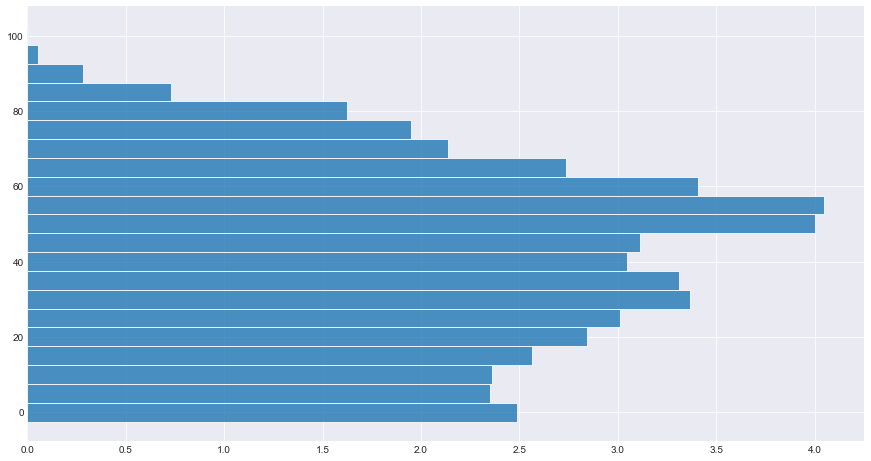

In [32]:
plt.style.use('seaborn-darkgrid')

country = 'Germany'
#simple implementation
pos = df_demogr.loc[country]['AgeGrpStart'] #specify position on yaxis
val = df_demogr.loc[country]['PopMale%']*100 #specify value/length of each bar 
plt.figure(figsize=(15,8))
plt.barh(pos,val,5,align='center',edgecolor='white',alpha=0.8)

I didn't bother to specify any details here, as its clearly visible that this implementation won't cut it. After some google search I arrived at this [thread](https://stackoverflow.com/questions/27694221/using-python-libraries-to-plot-two-horizontal-bar-charts-sharing-same-y-axis). 

Lets start by specifying the length of the bars for male and female, i.e. `val_m` and `val_f` as well as the positions on the y-axis `pos`. Next, we use `plt.subplots()` to instanciate the figure and the axes. We specify 2 columns and that we want to have one y-axis for both subplots. Each axis object is set to either of the sexes, followed by some beautification processes. Given the position of the individual bars, we can add the age spans, given in the AgeGrp column of `df_demogr`, by changing the ticklabels on the yaxis. We finish it off, by setting the limits of the x-axis in both plots to be the same, as to achieve a symmetric layout.     

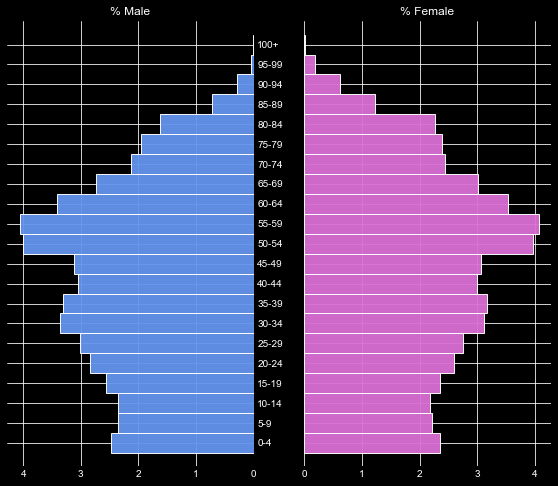

In [33]:
country = 'Germany' #specify the country of your choice

plt.style.use('dark_background') #trying out a different style
#plt.style.use('seaborn-darkgrid')

pos = df_demogr.loc[country]['AgeGrpStart']
val_m = df_demogr.loc[country]['PopMale%']*100
val_f = df_demogr.loc[country]['PopFemale%']*100

fig, axes = plt.subplots(figsize=(8,7), ncols=2, sharey=True) #two subplots with shared yaxis
axes[0].barh(pos, val_m, 5, align='center', color='cornflowerblue', zorder=10, edgecolor='white',alpha=0.95)
axes[0].set(title='% Male')
axes[1].barh(pos, val_f, 5, align='center', color='orchid', zorder=10, edgecolor='white',alpha=0.95)
axes[1].set(title='% Female')

#the names give away what is done here...
axes[0].invert_xaxis()
axes[0].set(yticks=pos, yticklabels=df_demogr.loc['Germany']['AgeGrp']) #set label for yaxis equal to age groups
axes[0].yaxis.tick_right()

#make both plots of equal scale
axes[0].set_xlim(1.05*max(val_m.max(),val_f.max()),0)
axes[1].set_xlim(0,1.05*max(val_m.max(),val_f.max()))

plt.rc('font', size=15) #controls default text size

for ax in axes.flat:
    ax.margins(0.032) #set the "width" of the text on yaxis, i.e. the space between the plots
    ax.grid(True)

fig.tight_layout() #makes plot more compact
fig.subplots_adjust(wspace=0.205)
plt.show()

For the case of Germany, we see the typical population pyramid of a developed country with the largest population being in their 40's to their 60's.

It would be nice to save those plots for each country in an automated way. So lets write a wrapper function simular to `population_prediction_by_country` in section 3.1 that takes as input arguments a country name and the option to save the resulting figure to a specified directory via `plt.savefig`. In addition, why don't we plot the population prediction per age group from section 3.1 into the same figure? Now, the population pyramid already consists of two subplots and we would like to have them seperated from the line plot.

As I found out during my research for this project, matplotlib allows for the implementation of [subfigures within figures](https://matplotlib.org/stable/gallery/subplots_axes_and_figures/subfigures.html#sphx-glr-gallery-subplots-axes-and-figures-subfigures-py) since version 3.4. Simply create a subfigure object via `fig.subfigures(1,2)` to create a figure with one row and two columns of subfigures. Then, we follow the same procedure as before and instanciate axes objects for each subfigure.

In [34]:
def demographic_plot2(country, save2dir = False):

    fig = plt.figure(constrained_layout=True, figsize=(12, 6))

    subfigs = fig.subfigures(1, 2, wspace=0.07) #update to v3.4 to use this method, instaciate subfigures on a 1x2 grid

    plt.style.use('dark_background')
    axsLeft = subfigs[0].subplots(1, 2, sharey=True) #create the framework for the population pyramid 
    
    #same code as before
    pos = df_demogr.loc[country]['AgeGrpStart']
    val_m = df_demogr.loc[country]['PopMale%']*100
    val_f = df_demogr.loc[country]['PopFemale%']*100


    axsLeft[0].barh(pos, val_m, 5, align='center', color='cornflowerblue', zorder=10, edgecolor='white',alpha=0.95)
    axsLeft[0].set(title='% Male')
    axsLeft[1].barh(pos, val_f, 5, align='center', color='orchid', zorder=10, edgecolor='white',alpha=0.95)
    axsLeft[1].set(title='% Female')

    axsLeft[0].invert_xaxis()
    axsLeft[0].set(yticks=pos, yticklabels=df_demogr.loc[country]['AgeGrp'])
    axsLeft[0].yaxis.tick_right()

    axsLeft[0].set_xlim(1.05*max(val_m.max(),val_f.max()),0)
    axsLeft[1].set_xlim(0,1.05*max(val_m.max(),val_f.max()))

    subfigs[0].suptitle('Demographic Distribution', fontsize=25)

    for ax in axsLeft.flat:
        ax.margins(0.02)
        ax.grid(True)
    
    #create the framework for the stackplot from section 3.1
    axsRight = subfigs[1].subplots(1,1)
    
    #same code as before
    df_country = df.loc[(df['Variant']=='High') & (df['Location']==country),:]

    df_country_grp = df_country[['Time','AgeGrp','PopTotal']].groupby(['AgeGrp','Time']).sum()*1000
    df_0 = df_country_grp.loc['0-4',:] + df_country_grp.loc['5-9',:] + df_country_grp.loc['10-14',:] + df_country_grp.loc['15-19',:]
    df_20 = df_country_grp.loc['20-24',:] + df_country_grp.loc['25-29',:] + df_country_grp.loc['30-34',:] + df_country_grp.loc['35-39',:]
    df_40 = df_country_grp.loc['40-44',:] + df_country_grp.loc['45-49',:] + df_country_grp.loc['50-54',:] + df_country_grp.loc['55-59',:]
    df_60 = df_country_grp.loc['60-64',:] + df_country_grp.loc['65-69',:] + df_country_grp.loc['70-74',:] + df_country_grp.loc['75-79',:]
    df_80p = df_country_grp.loc['80-84',:] + df_country_grp.loc['85-89',:] + df_country_grp.loc['90-94',:] + df_country_grp.loc['95-99',:] + df_country_grp.loc['100+',:]

    axsRight.stackplot(df_0.index,
                  df_0['PopTotal'],
                  df_20['PopTotal'],
                  df_40['PopTotal'],
                  df_60['PopTotal'],
                  df_80p['PopTotal'],
                 edgecolor='white',alpha=0.6,
                  colors = list(plt.cm.get_cmap('inferno', 7).colors),
                  labels = ['0-19','20-39','40-59','60-79','80+']
                 )
    subfigs[1].suptitle('Population prediction of Age Groups', fontsize=25)
    axsRight.legend(fontsize=18,loc=2)    

    fig.suptitle(country, fontsize=40)

    #allow for the option to save the resulting figure
    if save2dir:
        #do a string replace for entries like Australia/New Zeeland, which treat the / as a new subdirectory
        plt.savefig(result_dir + 'demographic/{}_demographic.png'.format(country.replace('/','#')), dpi=75)
    plt.close(fig)
    
    return(fig)


Lets look at the resulting figure for Germany.

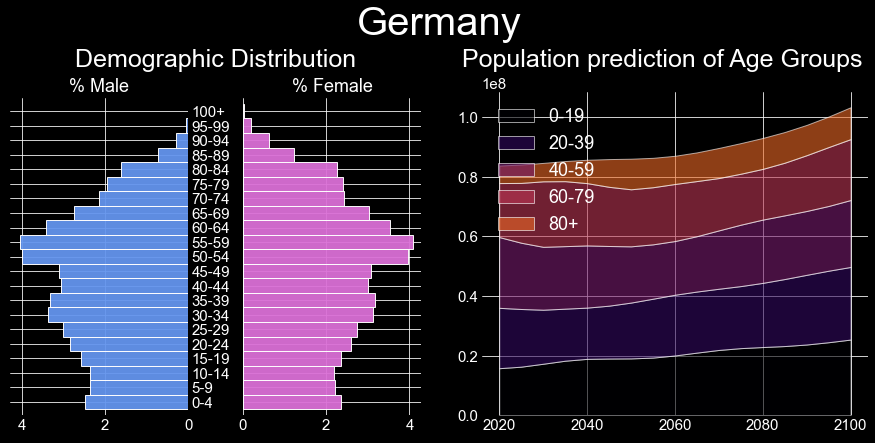

In [35]:
fig = demographic_plot2('Germany',False)
fig

In the following, we want to create an interactive map with the option of popup windows per country. Each popup window will contain the aforementioned figures. Now, one way to achieve this is to save each figure as a file and load it into the map statically. The resulting map is going to be a html file with quite the large filesize. Since I didn't find an alternative, this is how we will proceed.

For this, lets create a [pandas Series object](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.Series.html) with the unique country names, loop through it and apply our function in each iteration. 

In [36]:
df_countries = pd.Series(df_demogr['Location'].unique())

In [37]:
#save plots for all countries, becomes relevant in the next section
for country in tqdm_notebook(df_countries):
    demographic_plot2(country,True)

## 4 Interactive maps

In this final section, we will dive into the implementation of interactive maps. The possible applications are endless. You can visualize data on a wide range of granularity from countries to indivual streets. The basic commands however stay the same.

### 4.1. New packages: geojson and folium 

First things first: There is a large variety of packages available, specifically for plotting on maps in python, let it be static or interactive (search for *interactive maps in python* with the search engine of your choice and you will be overrun by search results). During my time at the SGFG, I tried a multitude of packages and in the end, I settled for [folium](https://python-visualization.github.io/folium/). It is relatively easy to use (you can create a map in seconds with a one-liner) and similar to matplotlib in the sense that it builds features on top of a kind of base map in a modular way. However, once you are interested in more elaborate visualizations, the documentation and tutorials get ever so rare. Folium was introduced into python, but it originates from Java. Thus, if you are looking for the really technical documentation, you are in for a treat. 

Lets get right into it. Given our results from the previous section, lets create a heatmap over every country, visualizing the predicted population gain from 2020 to 2025 (in the high fertility scenario). In addition, lets create popup windows that contain the population pyramids and growth per age group per country.

First however, how do we plot country borders on a map and what does the data needed for this task has to look like? The answer is the [geojson](https://geojson.org/) data format. It is similar to json in its structure, as we will see in a moment.

### 4.2 Exploring geodata

Being aware of the dataformat that we need, lets download some boundary data. After a quick search, I ended up [here](https://geojson-maps.ash.ms/) and downloaded the data in the highest resolution (feel free to choose the one your PC can handle). Loading the data into our session is easily done, via the [geojson package](https://python-geojson.readthedocs.io/en/latest/) and the base python command `open`.  

In [39]:
import geojson #load polygonal boundary data

#open file
with open(data_dir+'custom_highres.geo.json',encoding='utf-8') as f:
    gj_world = geojson.load(f)

Now, lets have a look into the data `gj_world` (gj for geojson). The following is a structured approach to explore the data.

>*Try to explore complicated data formats in a structured manner.*

Lets check out its `type` first.

In [42]:
type(gj_world)

geojson.feature.FeatureCollection

We see that its a feature collection. Using the `dir` command on this object, we see the methods that are applicable to it. Similar to a dictionary, it has a `keys()` method.   

In [43]:
gj_world.keys()

dict_keys(['type', 'features'])

`gj_world['type']` gives the same return as `type(gj_world)`, so lets check out 'features'.  

In [44]:
type(gj_world['features'])

list

We see its a list (we can assume that each of its elements corresponds to a different country), so lets get its first element and check out its type and methods via `type` and `dir`. We will find that it also contains keys, namely: 

In [45]:
gj_world['features'][0].keys() #check out key values of the first element in the list gj_world['features']

dict_keys(['type', 'geometry', 'properties'])

The interesting keys are *geometry* and *properties*. 

In [46]:
gj_world['features'][0]['geometry']

{"coordinates": [[[-69.996938, 12.577582], [-69.936391, 12.531724], [-69.924672, 12.519232], [-69.915761, 12.497016], [-69.880198, 12.453559], [-69.87682, 12.427395], [-69.888092, 12.41767], [-69.908803, 12.417792], [-69.930531, 12.425971], [-69.945139, 12.440375], [-69.924672, 12.440375], [-69.924672, 12.447211], [-69.958567, 12.463202], [-70.027659, 12.522935], [-70.048085, 12.531155], [-70.058095, 12.537177], [-70.062408, 12.54682], [-70.060374, 12.556952], [-70.051096, 12.574042], [-70.048736, 12.583726], [-70.052642, 12.600002], [-70.059641, 12.614244], [-70.061106, 12.625393], [-70.048736, 12.632148], [-70.007151, 12.585517], [-69.996938, 12.577582]]], "type": "Polygon"}

As expected, the geometry key contains the polygonal boundary data of the country.

In [47]:
gj_world['features'][0]['properties']

{'scalerank': 3,
 'featurecla': 'Admin-0 country',
 'labelrank': 5,
 'sovereignt': 'Netherlands',
 'sov_a3': 'NL1',
 'adm0_dif': 1,
 'level': 2,
 'type': 'Country',
 'admin': 'Aruba',
 'adm0_a3': 'ABW',
 'geou_dif': 0,
 'geounit': 'Aruba',
 'gu_a3': 'ABW',
 'su_dif': 0,
 'subunit': 'Aruba',
 'su_a3': 'ABW',
 'brk_diff': 0,
 'name': 'Aruba',
 'name_long': 'Aruba',
 'brk_a3': 'ABW',
 'brk_name': 'Aruba',
 'brk_group': None,
 'abbrev': 'Aruba',
 'postal': 'AW',
 'formal_en': 'Aruba',
 'formal_fr': None,
 'note_adm0': 'Neth.',
 'note_brk': None,
 'name_sort': 'Aruba',
 'name_alt': None,
 'mapcolor7': 4,
 'mapcolor8': 2,
 'mapcolor9': 2,
 'mapcolor13': 9,
 'pop_est': 103065,
 'gdp_md_est': 2258,
 'pop_year': -99,
 'lastcensus': 2010,
 'gdp_year': -99,
 'economy': '6. Developing region',
 'income_grp': '2. High income: nonOECD',
 'wikipedia': -99,
 'fips_10_': 'AA',
 'iso_a2': 'AW',
 'iso_a3': 'ABW',
 'iso_n3': '533',
 'un_a3': '533',
 'wb_a2': 'AW',
 'wb_a3': 'ABW',
 'woe_id': 23424736,
 'w

The properties key contains meta information. Depending on your analysis you might be interested in different attributes. For us, only the name is important now.   

In [48]:
gj_world['features'][0]['properties']['admin']

'Aruba'

We see that the first element in this list represents Aruba, a constituent country in the Kingdom of the  Netherlands. 

Now that we now, where the country names are located inside `gj_world`, we can create the naming list `gj_names`. 

In [49]:
#create naming list
gj_names = np.zeros(len(gj_world['features']),dtype='U50') # U50 = string 50 characters
for idx in range(len(gj_names)):
    gj_names[idx] = gj_world['features'][idx]['properties']['admin']  

### 4.3 The mapping struggle

At this stage, we run into a typical problem. We have two different datasets that we want to merge. Namely, our figures from section 3.3 based on the `df_demogr` dataframe with the country namings `df_countries` and our geojson polygonal boundary coordinates in `gj_world` with its naming list `gj_names`. For a one to one correspondense, we need the names in `df_countries` and `gj_names` to be the same. As you can probably imagine, this is not the case. Lets look at the missing countries inside `df_countries` (i.e. the ones that are not in `gj_names`) 

In [50]:
#find missing countires
gj_missing = df_countries[~df_countries.isin(gj_names)].reset_index(drop=True)
for idx in range(len(gj_missing)):
    print(gj_missing[idx])

Africa
Asia
Australia/New Zealand
Bahamas
Bolivia (Plurinational State of)
Brunei Darussalam
Cabo Verde
Caribbean
Central America
Central Asia
Central and Southern Asia
Channel Islands
China, Hong Kong SAR
China, Macao SAR
China, Taiwan Province of China
Congo
Czechia
Côte d'Ivoire
Dem. People's Republic of Korea
Eastern Africa
Eastern Asia
Eastern Europe
Eastern and South-Eastern Asia
Eswatini
Europe
Europe and Northern America
French Guiana
Guadeloupe
Guinea-Bissau
High-income countries
Iran (Islamic Republic of)
Land-locked Developing Countries (LLDC)
Lao People's Democratic Republic
Latin America and the Caribbean
Least developed countries
Less developed regions
Less developed regions, excluding China
Less developed regions, excluding least developed countries
Low-income countries
Lower-middle-income countries
Maldives
Martinique
Mauritius
Mayotte
Melanesia
Micronesia
Micronesia (Fed. States of)
Middle Africa
Middle-income countries
More developed regions
No income group available


At this point, there is only one way forward: go through each country one by one and check if its inside both datasets. If so, create a mapping between the two. Lets create a pandas Series from `df_countries` and name it `mapping_names`. Its index corresponds to the naming from `df_coutries`, while the corresponding entries are the ones from `gj_names`.    

In [51]:
#create mapping table between the two datasets
mapping_names = df_countries.copy()
mapping_names.index = df_countries.copy()

mapping_names['Bahamas'] = 'The Bahamas'
mapping_names['Bolivia (Plurinational State of)'] = 'Bolivia'
mapping_names['Brunei Darussalam'] = 'Brunei'
mapping_names['Cabo Verde'] = 'Cape Verde'
mapping_names['China, Hong Kong SAR'] = 'Hong Kong'
mapping_names['China, Macao SAR'] = 'Macao'
mapping_names['China, Taiwan Province of China'] = 'Taiwan'
mapping_names['Congo'] = 'Republic of Congo'
mapping_names['Czechia'] = 'Czech Republic'
mapping_names['Côte d\'Ivoire'] = 'Ivory Coast'
mapping_names['Dem. People\'s Republic of Korea'] = 'North Korea'
mapping_names['Eswatini'] = 'Swaziland'
#mapping_names['French Guiana'] = 'Guyana'
mapping_names['Guinea-Bissau'] = 'Guinea Bissau'
mapping_names['Iran (Islamic Republic of)'] = 'Iran'
mapping_names['Lao People\'s Democratic Republic'] = 'Laos'
mapping_names['Republic of Korea'] = 'South Korea'
mapping_names['Republic of Moldova'] = 'Moldova'
mapping_names['Russian Federation'] = 'Russia'
mapping_names['Serbia'] = 'Republic of Serbia'
mapping_names['State of Palestine'] = 'Palestine'
mapping_names['Syrian Arab Republic'] = 'Syria'
mapping_names['Timor-Leste'] = 'East Timor'
mapping_names['Venezuela (Bolivarian Republic of)'] = 'Venezuela'
mapping_names['Viet Nam'] = 'Vietnam'

Now, our mapping table contains also whole regions (remember, it was created through `df_countries` which had entries like *Developed Countries* and *World*). Lets filter those out and create a new, filtered version of the mapping table. 

In [52]:
#get the countries that are both in the dataframe and in the geojson file
mapping_filtered_names = mapping_names[mapping_names.isin(gj_names)]
mapping_filtered_names.index = mapping_names[mapping_names.isin(gj_names)].index

mapping_filtered_names = mapping_filtered_names.to_frame() #make a dataframe out of it
mapping_filtered_names.reset_index(inplace=True)
mapping_filtered_names.columns = ['df','gj'] #set the columns equal to df for df_countries and gj for gj_names

In [53]:
mapping_filtered_names

,df,gj
0,Afghanistan,Afghanistan
1,Albania,Albania
2,Algeria,Algeria
3,Angola,Angola
4,Antigua and Barbuda,Antigua and Barbuda
...,...,...
183,Viet Nam,Vietnam
184,Western Sahara,Western Sahara
185,Yemen,Yemen
186,Zambia,Zambia


We created a one to one correspondense between our boundary data and our dataframe. On the way we lost some entries, but overall we should be fine (feel free to check how many entries we lost in either of the two data objects). With that, we are able to create a filtered version of `gj_world`. First we copy it, then we initialize its features key to be an empty list. Now, let us copy only those country entries from the original geojson data that are part of the mapping table. We do this in the following, by looping through all countries in `gj_names`. In every iteration, we create the `condition` object. It checks whether or not the respective country name is in the mapping table. If it is (i.e if the condition object is not empty), we copy the information from the original `gj_world`. 

Let us do one more thing that will become apparent in a moment. We want to include a heatmap into our interactive map. For this to work in folium, we need to have an id-key in our geojson object. So, lets include one that corresponds to the order of the countries in the mapping table. This can easily be done through the first entry of our condition object.  

In [54]:
#create new (filtered) geojson file
gj_world_f = gj_world.copy()
gj_world_f['features'] = []
#demography_dict = {}
for idx in range(len(gj_names)):
    condition = mapping_filtered_names.loc[mapping_filtered_names['gj'] == gj_names[idx],:]
    if not condition.empty:
        temp = gj_world['features'][idx].copy()
        #add the dataframe of age distribution as an object to the nested dictionary
        #temp['properties']['dataframe'] = df_demogr.loc[condition['df']]
        temp['id'] = int(condition.index[0]) #add a new key for referencing purposes  
        gj_world_f['features'].append(temp)
        #demography_dict[condition.index[0]] = df_demogr.loc[condition['df']]

We are amost there. We need to get the data for the heatmap into a specific format, too. It needs to be a series object with its index equal to the aforementioned id-key. Start by adding a new column to `mapping_filtered_names` called gain. As discussed in section 4.1, we want to visualize the predicted population *gain*. For this, we can use the dataframe `df_gain` from section 3.2. In a similar fashion as before, we can loop through all the countries (country names equal to the ones in `df_gain`, i.e. `df_countries`) and filter for the right values. 

Finally, lets single out the gain column from our dataframe and set its index name to ID (this is needed such that the heatmap comes out right).

In [55]:
#create dataframe with data for heatmap plot such that we can reference our geojson data (gj_world_f) with it  
mapping_filtered_names['gain'] = 0
for idx in mapping_filtered_names.index:
    mapping_filtered_names.loc[idx,'gain'] = df_gain.loc[mapping_filtered_names.loc[idx,'df'],'PopIncrease']

    
population_gain = mapping_filtered_names['gain'].reset_index()
population_gain.columns = ['ID','gain']    

#define a series with the same indexing as the boundary data gj_world_f
population_dict_gain = population_gain.set_index('ID')['gain']

The object looks like this now

In [56]:
population_dict_gain

ID
0      12.794884
1      -0.421398
2       9.000436
3      18.027082
4       4.798423
         ...    
183     4.810680
184    12.934559
185    12.138178
186    16.324963
187     9.437367
Name: gain, Length: 188, dtype: float64

### 4.4 Creating an interactive heatmap with popup windows

In [57]:
from shapely.geometry import Point,shape #filter geo coordinates based on polygonal areas
import branca.colormap as cmp #define a color gradient manually 
from folium import IFrame
import base64
import folium #manipulate data and visualize on a Leaflet map 
from folium.map import *
from folium.plugins import MeasureControl
from folium.features import DivIcon

I think the best way to present folium, is in a sequential manner. So lets build everything step by step.

Creating a base map is easy. All you need is:

In [58]:
#specify starting location (longitute/latitude), zoom factor and art style for the tiles
world = folium.Map(location=(48.3984100, 9.9915500),
                            zoom_start=3,tiles='CartoDBPositron') 

world

So far so good. We created the map object `world`. You can zoom in and out and pull the map to either side.

Next, we want some colors for the heatmap. To get a good overview of predefined colormaps available from matplotlib, check out [this](https://matplotlib.org/stable/tutorials/colors/colormaps.html) documentation page. Here, I settled for *inferno*. Next, lets discretize this colormap into 10 distinct color values. After some research, I found out that this is done via `plt.cm.get_cmap('inferno', 10)`. Looking at its available methods via `dir`, you will see that you can extract its color via `.colors`. Create a list and save each color (wich is itself a list with 4 entries) as a single entry. 

What if you wanted to create your own custom color gradient? This is done via `cmp.LinearColormap`. Actually, we have to use it, as it is the function that will map colors based on some input value (in our case `population_dict_gain`, see the previous subsection) onto polygonal boundary data (here, `gj_world_f`) and it will provide our map with a color bar. It creates a continuous color gradient out of our color input list. We can specify a range for the allowed values to avoid skewing the whole visualization (see the "outliers" in the first histogram plot in section 3.2). We specify the maximum value to be the 95% quantile of our population gains. This means that any value that is higher than this threshold, will receive the same color (i.e. the outermost right one). It seems like we did some unnecessary steps back and forth, however this procedure allows us to add the color bar to our world map with a one-liner. 

In [59]:
cols_list = []
cols = plt.cm.get_cmap('inferno', 10).colors
for cc in cols:
    cols_list.append(list(cc))

#specify a continuous color gradient
linear_gain = cmp.LinearColormap(
    cols_list,
    #avoid skewing the coloring and define the gradient only up to the 95% quantile
    vmin=min(population_gain['gain']), vmax=population_gain['gain'].quantile(0.95),
    #set a suitable caption for the resulting map
    caption='Predicted increase in population between 2020-2025 in [%]' 
)
linear_gain

Now we focus on the heatmap itself. Actually, all our work has already been done.

We start by adding a control widget to our map that will allow us to enable or disable the heatmap layer (and for that manner, the layers that are going to be introduced later on). To this widget, we "add" the heatmap as a `FeatureGroup`. Being a feature group, we can add the actual map to the new heatmap object, instead of the map. This is done through `folium.GeoJson`. We need to specify the geojson data (i.e. `gj_world_f`) and a so called style function which specifies the way in which to set different color attributes of the geographic data. Here, we set the line color of our boundaries to be white, with a linewidth of 0.9 and an opacity of 0.7. The interesting attribute is the color for the filling of each area. Here, we set the previous color mapping fuction with its input equal to our pandas series with the predicted gain values (i.e. `population_dict_gain`). 

Now comes maybe the most difficult bit of technical information. It took me quite some time to figure it out and I would like to spare you this experience. The style function is actually a [lambda function](https://www.w3schools.com/python/python_lambda.asp). It takes a generalized input (in our case *feature*, which is a key inside `gj_world_f`) and does some manipulation on it. In our case, it is used to find the right index inside `population_dict_gain` via `feature['id']`. This was the reason for the inclusion of the id-key in the geojson data and the ID index in the pandas series for the gain data. With this, every country on the map will get assigned the right gain and with it, the right color. Add the color mapping function to the map (this has to happen after initializing the heatmap).

In [60]:
#this code block can take quite some time
heatmaps = folium.FeatureGroup(name='Heatmap').add_to(world) #add to control widget

folium.GeoJson(
    gj_world_f,
    style_function=lambda feature: {
        'fillColor': linear_gain(population_dict_gain[feature['id']]),
        'color': 'white',
        'weight': 0.9,
        'fillOpacity': 0.7
    }
).add_to(heatmaps)
linear_gain.add_to(world) #add to the world map
folium.LayerControl().add_to(world) #control widget
world

>**NOTE:** The next few lines of code are shown here only for the purpose of explaining the overall procedure. Afterwards, the code as whole for the creation and rendering into html of the complete map is shown. There is no need to run this cell  

Lets inculde some point markers in our map for each country as well as the country name. For this, we add a new feature group object to enable/disable the name. First, we need coordinates.

Doing a for loop and iterating over all features inside `gj_world_f['feature']`, we can extract the centroid (arithmetic mean position of x and y coordinates, i.e. longitude and latitude) for each boundary polygon. The easiest way, if you dont want to go into each polygon individually, is by converting the data inside the geometry key into a shapely object (check out [shapely.geometry](https://automating-gis-processes.github.io/site/notebooks/L1/geometric-objects.html)). Extract its x and y coordinates of its centroid and save the coordinates in the list `p`. Get the name attribute from the properties key and save it as `p_name`.

Next, lets bring our plots from section 3.3 into the game. They are saved under the results directory by their name as specified in `df_countries`. In order to get the names right, we have to do some mapping with `mapping_filtered_names`, so to stay consistent. Now, how to we embedd a .png file into our map? After a more or less quick search, I found and implemented [this](https://stackoverflow.com/questions/58227034/png-image-not-being-displayed-on-folium-map) solution, using a base64 encoding. Specifying the resolution, width and heigth and setting up an iFrame object, we can create the popup object via `folium.Popup`. With this at our disposal, we create the marker via `folium.Marker`. It takes as inputs the position `p` and the popup object. 

We finish this off by adding another marker object with position `p` and the country name `p_name` as an embedded html text to the feature group countries (for enabling/disabling the country names) as well as a simple circle marker at `p`. 

In [ ]:
countries = folium.FeatureGroup(name='Country Names').add_to(world)

for i in range(len(gj_world_f['features'])):
    #get coordinates and extract centroid
    coord = gj_world_f['features'][i]['geometry']['coordinates'][0]
    p = [shape(gj_world_f['features'][i]['geometry']).centroid.y,
         shape(gj_world_f['features'][i]['geometry']).centroid.x]    
    
    p_name = gj_world_f['features'][i]['properties']['admin'] #set name
    
    #include graphics into popup
    #find the right name via mapping table and include the path to its directory
    country = mapping_filtered_names.loc[
    mapping_filtered_names['gj']==gj_world_f['features'][i]['properties']['admin'],'df']
    
    #following code for the inculsion of fogures into the popup window of a folium map is taken from
    #https://stackoverflow.com/questions/58227034/png-image-not-being-displayed-on-folium-map
    path = result_dir + 'demographic/{}_demographic.png'.format(list(country)[0].replace('/',':'))
    encoded = base64.b64encode(open(path, 'rb').read()).decode()
    
    resolution, width, height = 75, 12, 6
    
    html = '<img src="data:image/png;base64,{}">'.format
    #create iframe object and use it as input for popup
    iframe = IFrame(html(encoded), width=(width*resolution)+20, height=(height*resolution)+20)
    popup = folium.Popup(iframe, max_width=2650)
    
    #add the marker with the popup window
    folium.Marker(p, icon=DivIcon(
        icon_size=(150,36),
        icon_anchor=(7,20),
       #html='<div style="font-size: 10pt; color : black">{}</div>'.format(p_name)
    ),
                 popup = popup
                 ).add_to(world)

    
    #add filter to show/hide country name
    folium.Marker(p, icon=DivIcon(
        icon_size=(150,36),
        icon_anchor=(7,20),
        html='<div style="font-size: 10pt; color : black">{}</div>'.format(p_name)),
                 ).add_to(countries)
    
    #add a single circle marker at the same position as the country name 
    world.add_child(folium.CircleMarker(p, radius=0.5,color='black'))

The map is done and we reached the end of this script. The following code is a summary of this last section. At the end, I included the command `world.save`. It will export and render the map as an html file. The file is static and can be further altered to be included in websides and other applications.

In [61]:
from shapely.geometry import Point,shape #filter geo coordinates based on polygonal areas
import branca.colormap as cmp #define a color gradient manually 
from folium import IFrame
import base64
import folium #manipulate data and visualize on a Leaflet map 
from folium.map import *
from folium.plugins import MeasureControl
from folium.features import DivIcon

cols_list = []
cols = plt.cm.get_cmap('inferno', 10).colors
for cc in cols:
    cols_list.append(list(cc))

#specify a continuous color gradient
linear_gain = cmp.LinearColormap(
    cols_list,
    #avoid skewing the coloring and define the gradient only up to the 95% quantile
    vmin=min(population_gain['gain']), vmax=population_gain['gain'].quantile(0.95),
    caption='Predicted increase in population between 2020-2025 in [%]'
)

world = folium.Map(location=(48.3984100, 9.9915500),
                            zoom_start=3,tiles='CartoDBPositron')
heatmaps = folium.FeatureGroup(name='Heatmap').add_to(world)
countries = folium.FeatureGroup(name='Country Names').add_to(world)
#add the heatmap
folium.GeoJson(
    gj_world_f,
    style_function=lambda feature: {
        'fillColor': linear_gain(population_dict_gain[feature['id']]),
        'color': 'white',
        'weight': 0.9,
        'fillOpacity': 0.7
    }
).add_to(heatmaps)
linear_gain.add_to(world)

for i in range(len(gj_world_f['features'])):
    coord = gj_world_f['features'][i]['geometry']['coordinates'][0]
    p = [shape(gj_world_f['features'][i]['geometry']).centroid.y,
         shape(gj_world_f['features'][i]['geometry']).centroid.x]    
    
    p_name = gj_world_f['features'][i]['properties']['admin']
    
    #include graphic
    country = mapping_filtered_names.loc[
    mapping_filtered_names['gj']==gj_world_f['features'][i]['properties']['admin'],'df']
    
    #taken from https://stackoverflow.com/questions/58227034/png-image-not-being-displayed-on-folium-map
    path = result_dir + 'demographic/{}_demographic.png'.format(list(country)[0].replace('/',':'))
    encoded = base64.b64encode(open(path, 'rb').read()).decode()
    
    resolution, width, height = 75, 12, 6
    
    html = '<img src="data:image/png;base64,{}">'.format
    iframe = IFrame(html(encoded), width=(width*resolution)+20, height=(height*resolution)+20)
    popup = folium.Popup(iframe, max_width=2650)
    
    folium.Marker(p, icon=DivIcon(
        icon_size=(150,36),
        icon_anchor=(7,20),
       #html='<div style="font-size: 10pt; color : black">{}</div>'.format(p_name)
    ),
                 popup = popup
                 ).add_to(world)

    
    #add filter to show/hide country name
    folium.Marker(p, icon=DivIcon(
        icon_size=(150,36),
        icon_anchor=(7,20),
        html='<div style="font-size: 10pt; color : black">{}</div>'.format(p_name)),
                 ).add_to(countries)
    
    world.add_child(folium.CircleMarker(p, radius=0.5,color='black'))

folium.LayerControl().add_to(world)

#export the final map as an html page 
world.save(result_dir+'world_gain.html')

You are still here? Go on now and explore the map that you have been building up in the past hour. You earned it!  

## BACKUP/OLD CODE

In [ ]:
def demographic_plot(country, save2dir = False):
    plt.style.use('dark_background')
    #plt.style.use('seaborn-darkgrid')

    #from https://stackoverflow.com/questions/27694221/using-python-libraries-to-plot-two-horizontal-bar-charts-sharing-same-y-axis
    #get colorlist from https://matplotlib.org/stable/gallery/color/named_colors.html
    
    pos = df_demogr.loc[country]['AgeGrpStart']
    val_m = df_demogr.loc[country]['PopMale%']*100
    val_f = df_demogr.loc[country]['PopFemale%']*100

    fig, axes = plt.subplots(figsize=(8,7), ncols=2, sharey=True)
    axes[0].barh(pos, val_m, 5, align='center', color='cornflowerblue', zorder=10, edgecolor='white',alpha=0.95)
    axes[0].set(title='% Male')
    axes[1].barh(pos, val_f, 5, align='center', color='orchid', zorder=10, edgecolor='white',alpha=0.95)
    axes[1].set(title='% Female')

    axes[0].invert_xaxis()
    axes[0].set(yticks=pos, yticklabels=df_demogr.loc['Germany']['AgeGrp'])
    axes[0].yaxis.tick_right()

    axes[0].set_xlim(1.05*max(val_m.max(),val_f.max()),0)
    axes[1].set_xlim(0,1.05*max(val_m.max(),val_f.max()))

    #plt.rc('font', size=15) #controls default text size

    for ax in axes.flat:
        ax.margins(0.03)
        ax.grid(True)

    fig.tight_layout()
    fig.subplots_adjust(wspace=0.205)
    if save2dir:
        #do a string replace for entries like Australia/New Zeeland, which treat the / as a new subdirectory
        plt.savefig(result_dir + 'demographic/{}_demographic.png'.format(country.replace('/','#')),
                   dpi=75)
    plt.close(fig)
    
    return(fig)

In [ ]:
fig = demographic_plot('Niger',False)
fig